<a href="https://colab.research.google.com/github/S-tej/ML-DL-Projects/blob/main/DL_small_projects.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Breast cancer classification using NN

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.datasets
from sklearn.model_selection import train_test_split

In [ ]:
data= sklearn.datasets.load_breast_cancer()

In [ ]:
print(data)

{'data': array([[1.799e+01, 1.038e+01, 1.228e+02, ..., 2.654e-01, 4.601e-01,
        1.189e-01],
       [2.057e+01, 1.777e+01, 1.329e+02, ..., 1.860e-01, 2.750e-01,
        8.902e-02],
       [1.969e+01, 2.125e+01, 1.300e+02, ..., 2.430e-01, 3.613e-01,
        8.758e-02],
       ...,
       [1.660e+01, 2.808e+01, 1.083e+02, ..., 1.418e-01, 2.218e-01,
        7.820e-02],
       [2.060e+01, 2.933e+01, 1.401e+02, ..., 2.650e-01, 4.087e-01,
        1.240e-01],
       [7.760e+00, 2.454e+01, 4.792e+01, ..., 0.000e+00, 2.871e-01,
        7.039e-02]]), 'target': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0,
       1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0,
       1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0,
 

In [ ]:
cancer_df= pd.DataFrame(data.data, columns= data.feature_names)

In [ ]:
cancer_df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [ ]:
cancer_df['label']=data.target

In [ ]:
cancer_df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,label
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0


In [ ]:
cancer_df.shape

(569, 31)

In [ ]:
cancer_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              569 non-null    float64
 1   mean texture             569 non-null    float64
 2   mean perimeter           569 non-null    float64
 3   mean area                569 non-null    float64
 4   mean smoothness          569 non-null    float64
 5   mean compactness         569 non-null    float64
 6   mean concavity           569 non-null    float64
 7   mean concave points      569 non-null    float64
 8   mean symmetry            569 non-null    float64
 9   mean fractal dimension   569 non-null    float64
 10  radius error             569 non-null    float64
 11  texture error            569 non-null    float64
 12  perimeter error          569 non-null    float64
 13  area error               569 non-null    float64
 14  smoothness error         5

In [ ]:
cancer_df.isnull().sum()

mean radius                0
mean texture               0
mean perimeter             0
mean area                  0
mean smoothness            0
mean compactness           0
mean concavity             0
mean concave points        0
mean symmetry              0
mean fractal dimension     0
radius error               0
texture error              0
perimeter error            0
area error                 0
smoothness error           0
compactness error          0
concavity error            0
concave points error       0
symmetry error             0
fractal dimension error    0
worst radius               0
worst texture              0
worst perimeter            0
worst area                 0
worst smoothness           0
worst compactness          0
worst concavity            0
worst concave points       0
worst symmetry             0
worst fractal dimension    0
label                      0
dtype: int64

In [ ]:
cancer_df['label'].value_counts()

label
1    357
0    212
Name: count, dtype: int64

In [ ]:
cancer_df.groupby('label').mean()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
label,,,,,,,,,,,,,,,,,,,,,
0,17.462830,21.604906,115.365377,978.376415,0.102898,0.145188,0.160775,0.087990,0.192909,0.062680,...,21.134811,29.318208,141.370330,1422.286321,0.144845,0.374824,0.450606,0.182237,0.323468,0.091530
1,12.146524,17.914762,78.075406,462.790196,0.092478,0.080085,0.046058,0.025717,0.174186,0.062867,...,13.379801,23.515070,87.005938,558.899440,0.124959,0.182673,0.166238,0.074444,0.270246,0.079442


In [ ]:
X= cancer_df.drop(columns='label', axis=1)
Y= cancer_df['label']

In [ ]:
print(X)
print(Y)

     mean radius  mean texture  mean perimeter  mean area  mean smoothness  \
0          17.99         10.38          122.80     1001.0          0.11840   
1          20.57         17.77          132.90     1326.0          0.08474   
2          19.69         21.25          130.00     1203.0          0.10960   
3          11.42         20.38           77.58      386.1          0.14250   
4          20.29         14.34          135.10     1297.0          0.10030   
..           ...           ...             ...        ...              ...   
564        21.56         22.39          142.00     1479.0          0.11100   
565        20.13         28.25          131.20     1261.0          0.09780   
566        16.60         28.08          108.30      858.1          0.08455   
567        20.60         29.33          140.10     1265.0          0.11780   
568         7.76         24.54           47.92      181.0          0.05263   

     mean compactness  mean concavity  mean concave points  mea

In [ ]:
X_train,X_test,Y_train,Y_test= train_test_split(X,Y, test_size=0.2, random_state=2,stratify=Y)

Standardize the data

In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
scaler= StandardScaler()

X_train_std= scaler.fit_transform(X_train)

X_test_std= scaler.transform(X_test)

**Construction of CNN model**

In [ ]:
#importing tensorflow and keras
import tensorflow as tf
tf.random.set_seed(3)
from tensorflow import keras

In [ ]:
#setting up th layers of neural network

model=keras.Sequential([

                        keras.layers.Flatten(input_shape=(30,)),
                        keras.layers.Dense(20,activation='relu'),
                        keras.layers.Dense(2,activation='sigmoid')

])


In [ ]:
#compiing the neural network

model.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])


In [ ]:
#Training the neural network

history=model.fit(X_train_std,Y_train,validation_split=0.1,epochs=10)

Epoch 1/10
13/13 [==============================] - 1s 17ms/step - loss: 0.8593 - accuracy: 0.5526 - val_loss: 0.5312 - val_accuracy: 0.7391
Epoch 2/10
13/13 [==============================] - 0s 5ms/step - loss: 0.5730 - accuracy: 0.7090 - val_loss: 0.3545 - val_accuracy: 0.9130
Epoch 3/10
13/13 [==============================] - 0s 4ms/step - loss: 0.4051 - accuracy: 0.8313 - val_loss: 0.2662 - val_accuracy: 0.9565
Epoch 4/10
13/13 [==============================] - 0s 4ms/step - loss: 0.3164 - accuracy: 0.8875 - val_loss: 0.2189 - val_accuracy: 0.9783
Epoch 5/10
13/13 [==============================] - 0s 4ms/step - loss: 0.2636 - accuracy: 0.9022 - val_loss: 0.1864 - val_accuracy: 0.9783
Epoch 6/10
13/13 [==============================] - 0s 4ms/step - loss: 0.2267 - accuracy: 0.9120 - val_loss: 0.1631 - val_accuracy: 0.9783
Epoch 7/10
13/13 [==============================] - 0s 5ms/step - loss: 0.2003 - accuracy: 0.9291 - val_loss: 0.1443 - val_accuracy: 0.9783
Epoch 8/10
13/13 [=

Visualizing accuracy and loss

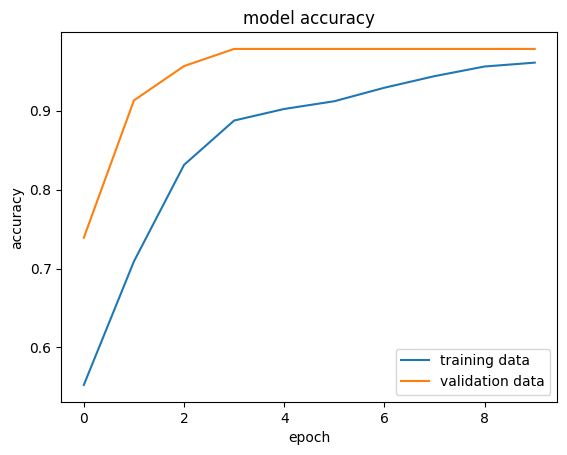

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])

plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')

plt.legend(['training data','validation data'],loc='lower right')

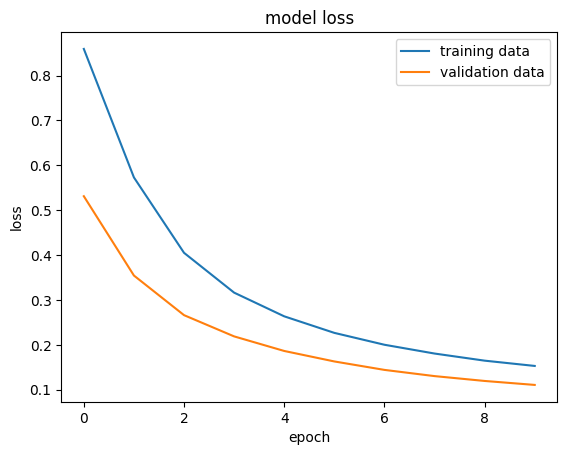

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')

plt.legend(['training data','validation data'],loc='upper right')

**Accuracy of the model on test data**

In [ ]:
loss,accuracy=model.evaluate(X_test_std,Y_test)
print(accuracy)

4/4 [==============================] - 0s 3ms/step - loss: 0.1216 - accuracy: 0.9737
0.9736841917037964


In [ ]:
print(X_test_std.shape)
print(X_test_std[0])

(114, 30)
[ 0.44199702  0.212229    0.42163229  0.28029849  0.46059068  0.31923771
  0.32738868  0.3980721   0.45467963  0.05268291 -0.22649032 -0.56019683
 -0.32014237 -0.19125366 -0.76043663 -0.08046584 -0.26006979 -0.51214349
 -0.33901861 -0.23280218  0.65164049  0.74215747  0.53471259  0.33156671
  1.02726691  1.30534397  0.62768506  0.50566574  1.76577066  1.29575996]


In [ ]:
Y_pred=model.predict(X_test_std)

4/4 [==============================] - 0s 3ms/step


In [ ]:
print(Y_pred.shape)
print(Y_pred[2])

(114, 2)
[0.2470315 0.9543148]


Model.predict() will give prediction probability of each class for the data point

In [ ]:
#converting the prediction probability to class labels
Y_pred_list=[np.argmax(i) for i in Y_pred]
print(Y_pred_list)

[0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1]


**Building the predictive system**

In [ ]:
input_data=(8.598,20.98,54.66,221.8,0.1243,0.08963,0.03,0.009259,0.1828,0.06757,0.3582,2.067,2.493,18.39,0.01193,0.03162,0.03,0.009259,0.03357,0.003048,9.565,27.04,62.06,273.9,0.1639,0.1698,0.09001,0.02778,0.2972,0.07712)

input_data_as_numpy_array=np.asarray(input_data)

input_data_reshaped=input_data_as_numpy_array.reshape(1,-1)

input_data_std=scaler.transform(input_data_reshaped)

prediction=model.predict(input_data_std)

print(prediction)

prediction_label=[np.argmax(prediction)]
print(prediction_label)

if(prediction_label[0]==0):
  print('The tumor is Malignant')

else:
  print('The tumor is Benign')

1/1 [==============================] - 0s 25ms/step
[[0.21603939 0.8943338 ]]
[1]
The tumor is Benign


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


#MNIST Handwritten digit classification using Deep Learning(Neural Networks)

In [ ]:
#importing dependencies
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from google.colab.patches import cv2_imshow
from PIL import Image
import tensorflow as tf
tf.random.set_seed(3)
from tensorflow import keras
from keras.datasets import mnist
from tensorflow.math import confusion_matrix

Loading MNIST data from Keras Dataset

In [ ]:
(X_train,Y_train),(X_test,Y_test)=mnist.load_data()

11490434/11490434 [==============================] - 1s 0us/step


In [ ]:
print(X_train.shape,Y_train.shape,X_test.shape,Y_test.shape)

(60000, 28, 28) (60000,) (10000, 28, 28) (10000,)


In [ ]:
type(X_train)

numpy.ndarray

Training data = 60,000

Test data = 10,000

Image Dimension --> 28 x 28

All are grayscale images(only one matrix)

In [ ]:
#Printing the 20th image in the training data
print(X_train[20])

[[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0  38
  190  25   0   0   0   0   0   0   0   0]
 [  0   0   0  13  25  10   0   0   0   0   0   0   0   0   0   0   0 112
  252 125   4   0   0   0   0   0   0   0]
 [  0   0   0 132 252 113   0   0   0   0   0   0   0   0   0   0   0  61
  252 252  36   0   0   0   0   0   0   0]
 [  0   0   0 132 252 240  79   0   0   0   0   0   0   0   0   0   0  84
  252 252  36   0   0   0   0   0   0   0]
 [  0   0   0 132 252 252 238  52   0   0   0   0   0   0   0   

In [ ]:
X_train[20].shape

(28, 28)

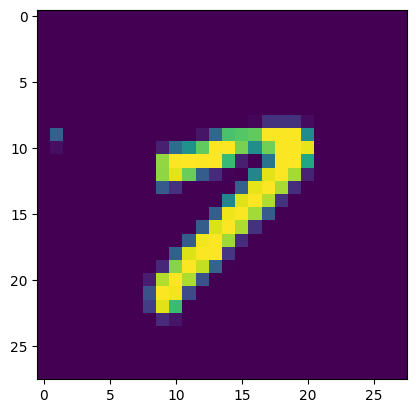

7


In [ ]:
#Displaying the image
plt.imshow(X_train[29])
plt.show()

#printing the corresponding label
print(Y_train[29])

Image Labels

In [ ]:
print(Y_train.shape,Y_test.shape)

(60000,) (10000,)


In [ ]:
#Printing the unique values in Y_train
print(np.unique(Y_train))

#Printing the unique values in Y_test
print(np.unique(Y_test))

[0 1 2 3 4 5 6 7 8 9]
[0 1 2 3 4 5 6 7 8 9]


**We can use these labels as such or we can apply One Hat encoding**

**All the images have the same dimensions in this dataset,if not,we have to resize all the images into common dimensions**

In [ ]:
#Scaling the values
#Values will be in the range of 0 and 1
X_train=X_train/255
X_test=X_test/255

Building the Neural Network

In [ ]:
#setting up the layers of neural network
model = keras.Sequential([

                          keras.layers.Flatten(input_shape=(28,28)),
                          keras.layers.Dense(50,activation='relu'),
                          keras.layers.Dense(50,activation='relu'),
                          keras.layers.Dense(10,activation='sigmoid')
])

In [ ]:
#compiling the neural network

model.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [ ]:
#training the neural network
model.fit(X_train,Y_train,epochs=10)

Epoch 1/10
1875/1875 [==============================] - 5s 2ms/step - loss: 0.2889 - accuracy: 0.9162
Epoch 2/10
1875/1875 [==============================] - 6s 3ms/step - loss: 0.1341 - accuracy: 0.9592
Epoch 3/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.1018 - accuracy: 0.9685
Epoch 4/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.0819 - accuracy: 0.9750
Epoch 5/10
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0683 - accuracy: 0.9789
Epoch 6/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.0595 - accuracy: 0.9817
Epoch 7/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.0517 - accuracy: 0.9832
Epoch 8/10
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0455 - accuracy: 0.9857
Epoch 9/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.0414 - accuracy: 0.9865
Epoch 10/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.035

Training data accuracy = 98.9%

**Accuracy on test data :**

In [ ]:
loss,accuracy=model.evaluate(X_test,Y_test)
print(accuracy)

313/313 [==============================] - 3s 6ms/step - loss: 0.0916 - accuracy: 0.9747
0.9746999740600586


Test Data accuracy = 97.5%

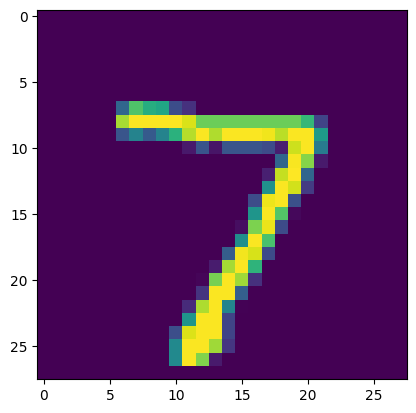

In [ ]:
#First image in test data
plt.imshow(X_test[0])
plt.show()

In [ ]:
print(Y_test[0])

7


In [ ]:
#predicting the test data using the model
Y_pred=model.predict(X_test)

313/313 [==============================] - 1s 3ms/step


In [ ]:
Y_pred.shape

(10000, 10)

In [ ]:
print(Y_pred[0])

[8.9870678e-05 5.4373926e-05 3.1816626e-01 9.2484140e-01 3.6274230e-08
 2.4325432e-02 8.5077822e-12 9.9999619e-01 1.8607609e-03 4.3629429e-01]


The neural network will predict all labels probability with the corresponding image.

In [ ]:
#converting the prediction probabilities to class label
Y_pred_label=[np.argmax(i) for i in Y_pred]
print(Y_pred_label)

[7, 2, 1, 0, 4, 1, 4, 9, 5, 9, 0, 6, 9, 0, 1, 5, 9, 7, 3, 4, 9, 6, 6, 5, 4, 0, 7, 4, 0, 1, 3, 1, 3, 4, 7, 2, 7, 1, 2, 1, 1, 7, 4, 2, 3, 5, 1, 2, 4, 4, 6, 3, 5, 5, 6, 0, 4, 1, 9, 5, 7, 8, 9, 3, 7, 4, 6, 4, 3, 0, 7, 0, 2, 9, 1, 7, 3, 2, 9, 7, 7, 6, 2, 7, 8, 4, 7, 3, 6, 1, 3, 6, 9, 3, 1, 4, 1, 7, 6, 9, 6, 0, 5, 4, 9, 9, 2, 1, 9, 4, 8, 7, 3, 9, 7, 4, 4, 4, 9, 2, 5, 4, 7, 6, 7, 9, 0, 5, 8, 5, 6, 6, 5, 7, 8, 1, 0, 1, 6, 4, 6, 7, 3, 1, 7, 1, 8, 2, 0, 9, 9, 9, 5, 5, 1, 5, 6, 0, 3, 4, 4, 6, 5, 4, 6, 5, 4, 5, 1, 4, 4, 7, 2, 3, 2, 7, 1, 8, 1, 8, 1, 8, 5, 0, 8, 9, 2, 5, 0, 1, 1, 1, 0, 9, 0, 3, 1, 6, 4, 2, 3, 6, 1, 1, 1, 3, 9, 5, 2, 9, 4, 5, 9, 3, 9, 0, 3, 5, 5, 5, 7, 2, 2, 7, 1, 2, 8, 4, 1, 7, 3, 3, 8, 8, 7, 9, 2, 2, 4, 1, 5, 8, 8, 7, 2, 3, 0, 2, 4, 2, 4, 1, 9, 5, 7, 7, 2, 8, 2, 6, 8, 5, 7, 7, 9, 1, 8, 1, 8, 0, 3, 0, 1, 9, 9, 4, 1, 8, 2, 1, 2, 9, 7, 5, 9, 2, 6, 4, 1, 5, 8, 2, 9, 2, 0, 4, 0, 0, 2, 8, 4, 7, 1, 2, 4, 0, 2, 7, 4, 3, 3, 0, 0, 5, 1, 9, 6, 5, 2, 5, 9, 7, 9, 3, 0, 4, 2, 0, 7, 1, 1, 2, 1, 

Y_test --> True Labels

Y_pred_labels --> Predicted Labels

Confusion Matrix

In [ ]:
cnf_mat=confusion_matrix(Y_test,Y_pred_label)
print(cnf_mat)

tf.Tensor(
[[ 963    0    0    2    2    5    3    1    4    0]
 [   0 1125    3    0    0    2    2    1    2    0]
 [   3    3 1009    4    3    2    0    3    3    2]
 [   0    1    6  976    0   17    0    2    7    1]
 [   0    1    6    0  962    2    3    1    0    7]
 [   2    0    0    3    2  871    5    3    6    0]
 [   0    3    1    0    7    9  935    0    3    0]
 [   0    7   10    1    1    0    0  999    4    6]
 [   4    2    5    4    5    7    3    2  939    3]
 [   2    3    0    3   22    3    0    4    4  968]], shape=(10, 10), dtype=int32)


Text(95.72222222222221, 0.5, 'True Labels')

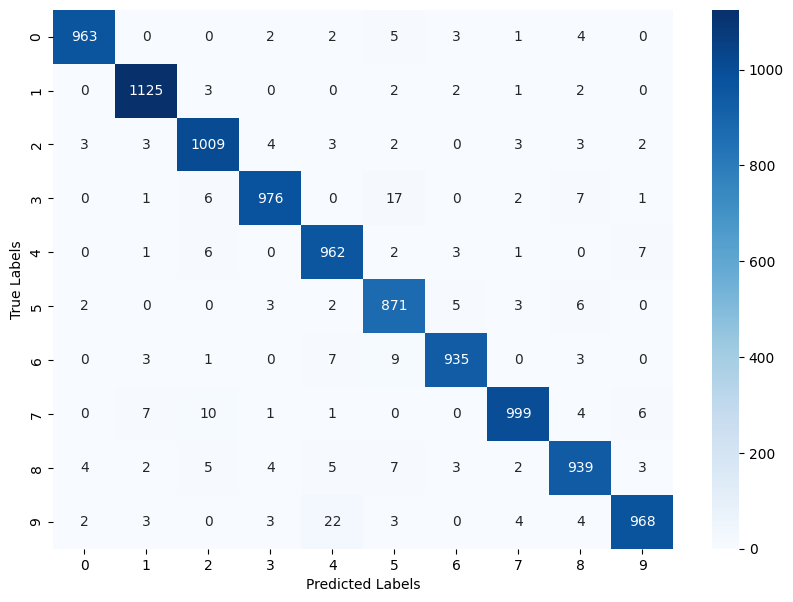

In [ ]:
plt.figure(figsize=(10,7))
sns.heatmap(cnf_mat,annot=True,fmt='d',cmap='Blues')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')

In [ ]:
!wget 'https://miro.medium.com/v2/resize:fit:451/0*kKxxK1YXSyWMEBtS.PNG'

--2024-06-25 10:38:33--  https://miro.medium.com/v2/resize:fit:451/0*kKxxK1YXSyWMEBtS.PNG
Resolving miro.medium.com (miro.medium.com)... 162.159.153.4, 162.159.152.4, 2606:4700:7::a29f:9904, ...
Connecting to miro.medium.com (miro.medium.com)|162.159.153.4|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2855 (2.8K) [image/png]
Saving to: ‘0*kKxxK1YXSyWMEBtS.PNG’

0*kKxxK1YXSyWMEBtS. 100%[===================>]   2.79K  --.-KB/s    in 0s      

2024-06-25 10:38:33 (42.2 MB/s) - ‘0*kKxxK1YXSyWMEBtS.PNG’ saved [2855/2855]



Building the predictive system

In [ ]:
input_image_path='/content/new.jpg'

input_image=cv2.imread(input_image_path)

In [ ]:
type(input_image)

numpy.ndarray

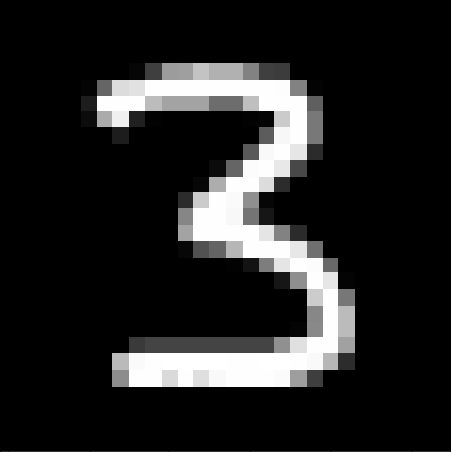

In [ ]:
cv2_imshow(input_image)

In [ ]:
print(input_image)

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[19 19 19]
  [19 19 19]
  [51 51 51]
  ...
  [51 51 51]
  [51 51 51]
  [19 19 19]]]


In [ ]:
input_image.shape

#It shows that it is in RGB

(452, 451, 3)

In [ ]:
grayscale=cv2.cvtColor(input_image,cv2.COLOR_RGB2GRAY)

In [ ]:
grayscale.shape

(452, 451)

In [ ]:
#resize the image
input_image_resized=cv2.resize(grayscale,(28,28))

In [ ]:
input_image_resized.shape

(28, 28)

In [ ]:
cv2_imshow(input_image_resized)

In [ ]:
input_image_resized=input_image_resized/255

In [ ]:
image_reshaped=np.reshape(input_image_resized,[1,28,28])

In [ ]:
input_prediction=model.predict(image_reshaped)
print(input_prediction)

1/1 [==============================] - 0s 117ms/step
[[4.1194243e-13 9.9997127e-01 8.6611891e-01 1.0000000e+00 7.7768927e-05
  1.9236125e-02 4.0255520e-15 6.0671711e-05 1.6833252e-01 9.5347306e-03]]


In [ ]:
input_pred_label=np.argmax(input_prediction)

In [ ]:
print(input_pred_label)

3


**Predictive System**

In [ ]:
input_image_path=input('Enter the image path to get predicted : ')

input_image=cv2.imread(input_image_path)

grayscale=cv2.cvtColor(input_image,cv2.COLOR_RGB2GRAY)

#resize the image
input_image_resized=cv2.resize(grayscale,(28,28))

cv2_imshow(input_image_resized)

input_image_resized=input_image_resized/255

image_reshaped=np.reshape(input_image_resized,[1,28,28])

input_prediction=model.predict(image_reshaped)
print(input_prediction)

input_pred_label=np.argmax(input_prediction)

print('The Handwritten Digit is Predicted as : ',input_pred_label)

Enter the image path to get predicted : /content/new.jpg


1/1 [==============================] - 0s 20ms/step
[[4.1194243e-13 9.9997127e-01 8.6611891e-01 1.0000000e+00 7.7768927e-05
  1.9236125e-02 4.0255520e-15 6.0671711e-05 1.6833252e-01 9.5347306e-03]]
The Handwritten Digit is Predicted as :  3


#Dog vs Cat

In [ ]:
#Configuring the path of kaggle.json file

!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

Importing Dog vs Cat Dataset from Kaggle

In [ ]:
#kaggle api
!kaggle competitions download -c dogs-vs-cats

 99% 808M/812M [00:09<00:00, 137MB/s]
100% 812M/812M [00:09<00:00, 88.3MB/s]


In [ ]:
!ls

dogs-vs-cats.zip  kaggle.json  sample_data


In [ ]:
#Extracting the compressed dataset
from zipfile import ZipFile

file='/content/dogs-vs-cats.zip'
with ZipFile(file,'r') as zip:
  zip.extractall()
  print('Done')

Done


In [ ]:
#Extracting the compressed dataset
from zipfile import ZipFile

file='/content/train.zip'
with ZipFile(file,'r') as zip:
  zip.extractall()
  print('Done')

Done


In [ ]:
import os
# Counting the no of files in the train folder
path,dirs,files=next(os.walk('/content/train'))
file_count=len(files)
print('No of images : ',file_count)

No of images :  25000


Printing the names of images

In [ ]:
file_names=os.listdir('/content/train')
print(file_names)

['cat.7035.jpg', 'dog.3685.jpg', 'dog.8451.jpg', 'dog.11241.jpg', 'dog.573.jpg', 'dog.8599.jpg', 'dog.8519.jpg', 'cat.10333.jpg', 'dog.1867.jpg', 'dog.4625.jpg', 'dog.8371.jpg', 'dog.10191.jpg', 'cat.4338.jpg', 'dog.6289.jpg', 'cat.2369.jpg', 'cat.6447.jpg', 'cat.9817.jpg', 'dog.9604.jpg', 'dog.10845.jpg', 'dog.9751.jpg', 'dog.8192.jpg', 'dog.4518.jpg', 'cat.9517.jpg', 'dog.2189.jpg', 'dog.4062.jpg', 'dog.3490.jpg', 'cat.7387.jpg', 'dog.10083.jpg', 'cat.1040.jpg', 'cat.7904.jpg', 'dog.9892.jpg', 'dog.830.jpg', 'dog.5996.jpg', 'dog.128.jpg', 'dog.6307.jpg', 'dog.5388.jpg', 'dog.3623.jpg', 'cat.7378.jpg', 'dog.5539.jpg', 'cat.12223.jpg', 'cat.10523.jpg', 'cat.1193.jpg', 'dog.8009.jpg', 'dog.2204.jpg', 'dog.102.jpg', 'dog.4938.jpg', 'dog.7035.jpg', 'dog.10542.jpg', 'dog.3853.jpg', 'dog.948.jpg', 'dog.9785.jpg', 'cat.3725.jpg', 'cat.9007.jpg', 'cat.7892.jpg', 'cat.10954.jpg', 'cat.4227.jpg', 'dog.4280.jpg', 'cat.1111.jpg', 'dog.4595.jpg', 'cat.5545.jpg', 'cat.3469.jpg', 'dog.10704.jpg', 'c

Importing the Dependencies

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mping
from PIL import Image
from sklearn.model_selection import train_test_split
from google.colab.patches import cv2_imshow

Displaying the images of Dogs and Cats

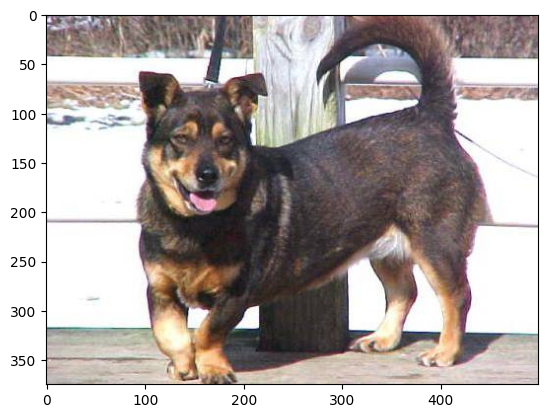

In [ ]:
#display Dog image
img=mping.imread('/content/train/dog.7028.jpg')
plt.imshow(img)
plt.show()

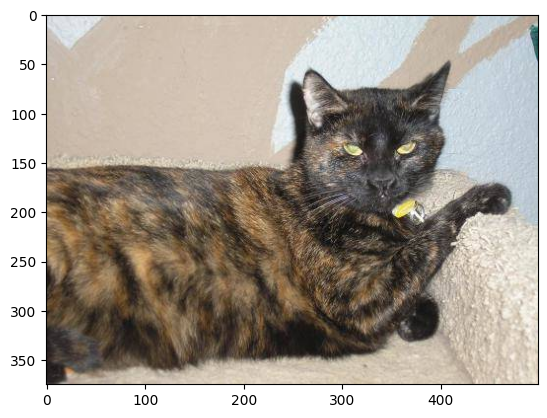

In [ ]:
#display Cat image
img=mping.imread('/content/train/cat.7035.jpg')
plt.imshow(img)
plt.show()

In [ ]:
file_names=os.listdir('/content/train')

dog_cnt=0
cat_cnt=0

for img_name in file_names:
  name=img_name[0:3]
  if name=='dog':
    dog_cnt+=1
  else:
    cat_cnt+=1

print('No of Dogs : ',dog_cnt)
print('No of Cats : ',cat_cnt)

No of Dogs :  12500
No of Cats :  12500


Resizing all the images

In [ ]:
#Creating a directory for resized images
os.mkdir('/content/image_resized')

In [ ]:
file_names=os.listdir('/content/train')

original_folder='/content/train/'
resized_folder='/content/image_resized/'

for i in range(2000):
  img=Image.open(original_folder+file_names[i])
  img=img.resize((224,224))
  img=img.convert('RGB')
  img.save(resized_folder+file_names[i])

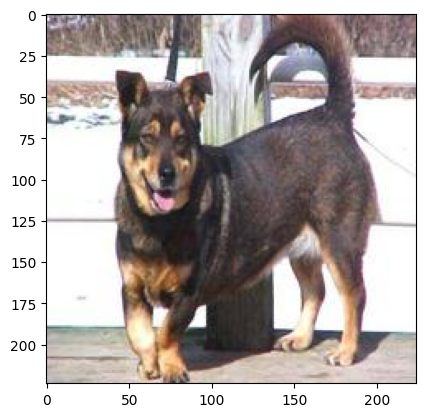

In [ ]:
#display Dog image
img=mping.imread('/content/image resized/dog.7028.jpg')
plt.imshow(img)
plt.show()

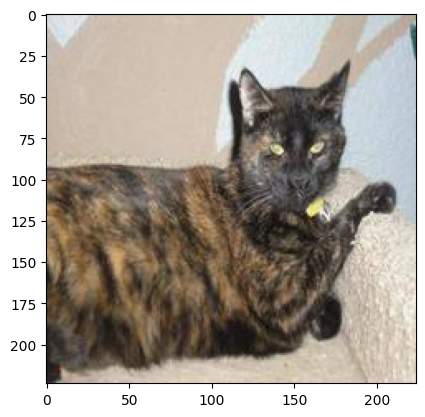

In [ ]:
#display Cat image
img=mping.imread('/content/image resized/cat.7035.jpg')
plt.imshow(img)
plt.show()

In [ ]:
file_names=os.listdir('/content/image_resized')

dog_cnt=0
cat_cnt=0

for img_name in file_names:
  name=img_name[0:3]
  if name=='dog':
    dog_cnt+=1
  else:
    cat_cnt+=1

print('No of Dogs : ',dog_cnt)
print('No of Cats : ',cat_cnt)

No of Dogs :  989
No of Cats :  1011


**Creating labels for the resized images**

Cat --> 0

Dog --> 1

In [ ]:
file_names=os.listdir('/content/image_resized')

labels=[]
for img_name in file_names:
  name=img_name[0:3]
  if name=='dog':
    labels.append(1)
  else:
    labels.append(0)

In [ ]:
print(file_names[0:5])
print(labels[0:5])

['cat.7035.jpg', 'dog.3685.jpg', 'dog.8451.jpg', 'dog.11241.jpg', 'dog.573.jpg']
[0, 1, 1, 1, 1]


In [ ]:
#counting the images of Dogs and Cats
values,counts=np.unique(labels,return_counts=True)
print(values)
print(counts)

[0 1]
[1011  989]


Converting the resized images into numpy array

In [ ]:
import cv2
import glob

In [ ]:
image_directory='/content/image_resized/'
image_extension=['jpg','png']

files=[]

[files.extend(glob.glob(image_directory+'*.'+e)) for e in image_extension]

dog_cat_images=np.asarray([cv2.imread(file) for file in files])

In [ ]:
print(dog_cat_images)

[[[[236 226 219]
   [227 217 210]
   [222 214 207]
   ...
   [140 166 182]
   [137 168 183]
   [141 175 188]]

  [[232 222 215]
   [225 217 210]
   [224 216 209]
   ...
   [144 170 184]
   [141 171 182]
   [140 173 182]]

  [[226 217 213]
   [224 215 211]
   [226 217 213]
   ...
   [150 172 183]
   [145 171 177]
   [139 168 172]]

  ...

  [[ 48  40  50]
   [ 43  39  45]
   [ 38  36  42]
   ...
   [206 224 231]
   [215 233 240]
   [203 221 228]]

  [[ 44  38  49]
   [ 38  33  42]
   [ 32  30  36]
   ...
   [201 219 226]
   [211 229 236]
   [200 218 225]]

  [[ 60  54  65]
   [ 51  48  57]
   [ 48  45  54]
   ...
   [195 213 220]
   [208 226 233]
   [197 215 222]]]


 [[[ 97 144 148]
   [ 76 123 127]
   [ 63 105 110]
   ...
   [ 46  71  91]
   [ 41  67  91]
   [ 31  57  81]]

  [[101 146 150]
   [ 77 122 126]
   [ 78 120 125]
   ...
   [ 46  71  91]
   [ 46  70  92]
   [ 46  73  94]]

  [[108 150 155]
   [ 89 129 134]
   [ 90 130 135]
   ...
   [ 46  70  88]
   [ 47  71  91]
   [ 62  87

In [ ]:
dog_cat_images.shape

(2000, 224, 224, 3)

In [ ]:
X=dog_cat_images
Y=np.asarray(labels)

Train Test Split

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,random_state=2,test_size=0.2)

In [ ]:
print(X.shape,X_train.shape,X_test.shape)

(2000, 224, 224, 3) (1600, 224, 224, 3) (400, 224, 224, 3)


In [ ]:
#scaling the data
X_train_scaled=X_train/255
X_test_scaled=X_test/255

Building the Neural Network

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub

In [ ]:
mobilenet_model='https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4'

pretrained_model=hub.KerasLayer(mobilenet_model,input_shape=(224,224,3),trainable=False)

In [ ]:
noof_classes=2

model=tf.keras.Sequential([

              pretrained_model,
              tf.keras.layers.Dense(noof_classes)
])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1280)              2257984   
                                                                 
 dense (Dense)               (None, 2)                 2562      
                                                                 
Total params: 2260546 (8.62 MB)
Trainable params: 2562 (10.01 KB)
Non-trainable params: 2257984 (8.61 MB)
_________________________________________________________________


In [ ]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy']
)

In [ ]:
model.fit(X_train_scaled,Y_train,epochs=5)

Epoch 1/5
50/50 [==============================] - 127s 2s/step - loss: 0.2387 - accuracy: 0.9000
Epoch 2/5
50/50 [==============================] - 100s 2s/step - loss: 0.0764 - accuracy: 0.9706
Epoch 3/5
50/50 [==============================] - 121s 2s/step - loss: 0.0551 - accuracy: 0.9806
Epoch 4/5
50/50 [==============================] - 103s 2s/step - loss: 0.0425 - accuracy: 0.9862
Epoch 5/5
50/50 [==============================] - 83s 2s/step - loss: 0.0339 - accuracy: 0.9912


In [ ]:
score,acc=model.evaluate(X_test_scaled,Y_test)
print('Test Loss = ',score)
print('Test Accuracy = ',acc)

13/13 [==============================] - 19s 1s/step - loss: 0.0769 - accuracy: 0.9625
Test Loss =  0.07693327963352203
Test Accuracy =  0.9624999761581421


Predictive System

Enter the path of thye image that has to be predictded/content/image resized/cat.1022.jpg


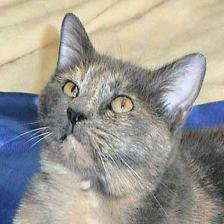

1/1 [==============================] - 0s 58ms/step
[[ 3.076442  -3.3410707]]
0
The image is of Cat


In [ ]:
input_image_path=input('Enter the path of thye image that has to be predictded')

input_image=cv2.imread(input_image_path)

cv2_imshow(input_image)

input_image_resized=cv2.resize(input_image,(224,224))

input_image_scaled=input_image_resized/255

input_image_reshaped=np.reshape(input_image_scaled,[1,224,224,3])

input_prediction=model.predict(input_image_reshaped)
print(input_prediction)

input_pred_label=np.argmax(input_prediction)
print(input_pred_label)

if input_pred_label==0:
  print('The image is of Cat')
else:
  print('The image is of Dog')

Enter the path of thye image that has to be predictded/content/dog1.jpg


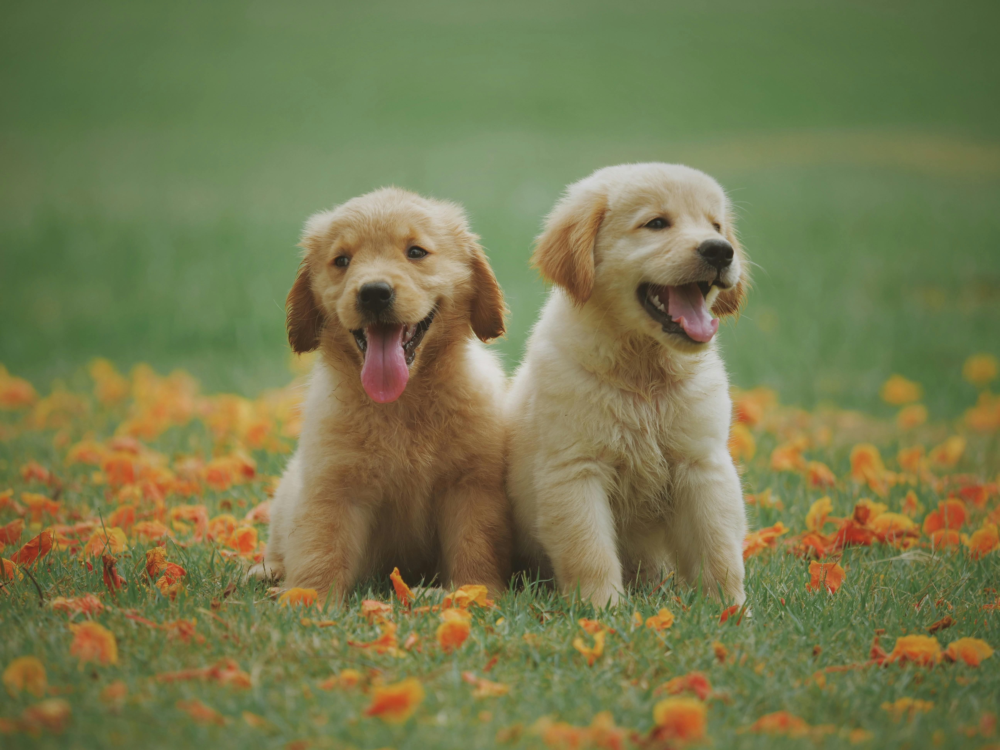

1/1 [==============================] - 0s 226ms/step
[[-1.7828057  2.5891693]]
1
The image is of Dog


In [ ]:
input_image_path=input('Enter the path of thye image that has to be predictded : ')

input_image=cv2.imread(input_image_path)

cv2_imshow(input_image)

input_image_resized=cv2.resize(input_image,(224,224))

input_image_scaled=input_image_resized/255

input_image_reshaped=np.reshape(input_image_scaled,[1,224,224,3])

input_prediction=model.predict(input_image_reshaped)
print(input_prediction)

input_pred_label=np.argmax(input_prediction)
print(input_pred_label)

if input_pred_label==0:
  print('The image is of Cat')
else:
  print('The image is of Dog')